## ODE for the elastic double pendulum

<img src="double_pendulum.PNG" width="30%">

Point-masses are connected by springs with a fixed support.  Use Hamilton’s principle (see lecture).  The position vector $q= (x1,y1,x2,y2)$ describes the positions of the two masses, the vector of momentum is $p= (p1x,p1y,p2x,p2y)$, the  x and y components of the momentum of the two masses.The  potential  energy $V(q)$  consists  of  the  energy  in  the  springs,  and  the  gravity potential.  Spring energy is given by $\frac{k}{2}(l−l_0)^2$, where $k$ is the stiffness of the spring, $l_0$ is the length of the spring in rest, and $l$ is the length of the spring after elongation. The gravity potential is $mρy$, where $ρ$ is the earth acceleration $9.81 ms$.

The  kinetic  energy  is $T(p)$,  the  sum  of  kinetic  energies $\frac{1}{2m}|p|^2$ of  all  point  masses. The dynamics of the system is given by Hamilton’s equations:

$\frac{dq}{dt}=\frac{dT}{dp}$ and $\frac{dp}{dt}=−\frac{dV}{dq}$

Choose the following paramters:
-  $m_1=m_2=  1$
-  $k_1=k_2=  100$
-  $l_{01}=l_{02}=  1$

and initial values 
-  $(x1(0),y1(0)) = (1,0)$
-  $(x2(0),y2(0)) = (2,0)$
-  $p(0) = 0$

### Potential energy

$ E_{spring 1} = \frac{k_1}{2}(\sqrt{x_1^2 + y_1^2} -l_{0, 1})^2 $

$ E_{spring 2} = \frac{k_2}{2}(\sqrt{(x_2-x_1)^2 + (y_2-y_1)^2} -l_{0, 2})^2 $

$ E_{grav 1} = y_1gm_1 $

$ E_{grav 2} = y_2gm_2 $

$ V(q) = \frac{k_1}{2}(\sqrt{x_1^2 + y_1^2} -l_{0, 1})^2 + \frac{k_2}{2}(\sqrt{(x_2-x_1)^2 + (y_2-y_1)^2} -l_{0, 2})^2 + m_1gy_1 + m_2gy_2 $

### Kinetic energy

$ E_{kin 1} = \frac{1}{2m_1}(p_{x, 1}^2 + p_{y, 1}^2) $

$ E_{kin 2} = \frac{1}{2m_1}(p_{x, 2}^2 + p_{y, 2}^2) $

$ T(p) = \frac{1}{2m_1}(p_{x, 1}^2 + p_{y, 1}^2) + \frac{1}{2m_2}(p_{x, 2}^2 + p_{y, 2}^2) $

## ODE

### dT/dp

$ \frac{dq_1}{dt} = \frac{\partial T}{\partial p_{x, 1}} = \frac{1}{m_1}p_{x, 1} $

$ \frac{dq_2}{dt} = \frac{\partial T}{\partial p_{y, 1}} = \frac{1}{m_1}p_{y, 1} $

$ \frac{dq_3}{dt} = \frac{\partial T}{\partial p_{x, 2}} = \frac{1}{m_2}p_{x, 2} $

$ \frac{dq_4}{dt} = \frac{\partial T}{\partial p_{y, 2}} = \frac{1}{m_2}p_{y, 2} $

### dV/dq

$ \frac{dp_1}{dt} = -\frac{\partial V}{\partial x_1} = -k_1 x_1 \frac{\sqrt{x_1^2 + y_1^2}- l_{0,1}}{\sqrt{x_1^2 + y_1^2}} + k_2 (x_2 - x_1) \frac{\sqrt{(x_2-x_1)^2 + (y_2-y_1)^2} - l_{0,2}}{\sqrt{(x_2-x_1)^2 + (y_2-y_1)^2}} $

$ \frac{dp_2}{dt} = -\frac{\partial V}{\partial y_1} = -k_1 y_1 \frac{\sqrt{x_1^2 + y_1^2}- l_{0,1}}{\sqrt{x_1^2 + y_1^2}} + k_2 (y_2 - y_1) \frac{\sqrt{(x_2-x_1)^2 + (y_2-y_1)^2} - l_{0,2}}{\sqrt{(x_2-x_1)^2 + (y_2-y_1)^2}} - m_1g $

$ \frac{dp_3}{dt} = -\frac{\partial V}{\partial x_2} = -k_2 (x_2 - x_1) \frac{\sqrt{(x_2-x_1)^2 + (y_2-y_1)^2} - l_{0,2}}{\sqrt{(x_2-x_1)^2 + (y_2-y_1)^2}} $

$ \frac{dp_2}{dt} = -\frac{\partial V}{\partial y_2} = -k_2 (y_2 - y_1) \frac{\sqrt{(x_2-x_1)^2 + (y_2-y_1)^2} - l_{0,2}}{\sqrt{(x_2-x_1)^2 + (y_2-y_1)^2}} -g m_2 $

In [68]:
from scipy.integrate import solve_ivp
import numpy as np
import matplotlib.pyplot as plt


def rhs_double_pendulum(t, state_vec, m1, m2, k1, k2, l01, l02):
    x1, y1, x2, y2, p1x, p1y, p2x, p2y = state_vec
    g = 9.81
    
    dq1_dt = p1x/m1
    dq2_dt = p1y/m1
    dq3_dt = p2x/m2
    dq4_dt = p2y/m2
    
    s1 = np.sqrt(x1**2 + y1**2)
    s2 = np.sqrt((x2-x1)**2 + (y2-y1)**2)
    dp1_dt = -k1*x1 * (s1 - l01)/s1 + k2*(x2-x1)*(s2-l02)/s2
    dp2_dt = -k1*y1 * (s1 - l01)/s1 + k2*(y2-y1)*(s2-l02)/s2 - m1 * g
    dp3_dt = -k2*(x2-x1)*(s2 - l02)/s2
    dp4_dt = -k2*(y2-y1)*(s2 - l02)/s2 - m2 * g
    
    return [dq1_dt, dq2_dt, dq3_dt, dq4_dt, dp1_dt, dp2_dt, dp3_dt, dp4_dt]


def V_T(state_vec, m1, m2, k1, k2, l01, l02):
    x1, y1, x2, y2, p1x, p1y, p2x, p2y = state_vec
    
    g = 9.81
    
    s1 = np.sqrt(x1**2 + y1**2)
    s2 = np.sqrt((x2-x1)**2 + (y2-y1)**2)
    
    V = k1/2*(s1-l01)**2 + k2/2*(s2-l02)**2 + m1*g*y1 + m2*g*y2
    T = 1/(2*m1)*(p1x**2 + p1y**2) + 1/(2*m2)*(p2x**2 + p2y**2)
    
    return V, T


sol = solve_ivp(rhs_double_pendulum, [0, 30], [1, 0, 2, 0, 0, 0, 0, 0], dense_output=True, 
                args=(1, 1, 100, 100, 1, 1), atol=1e-5, rtol=1e-8, method="Radau")
t = np.linspace(0, 30, 1000)
z = sol.sol(t)

x1, y1, x2, y2, p1x, p1y, p2x, p2y = z

VT_list = np.array([V_T(i, 1, 1, 100, 100, 1, 1) for i in z.T])

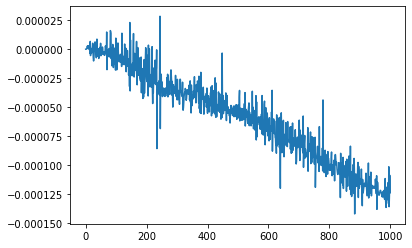

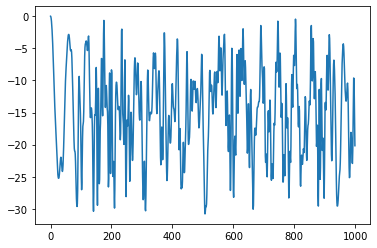

In [65]:
plt.figure()
plt.plot(np.sum(VT_list, axis=1))

plt.figure()
plt.plot(VT_list[:, 0])

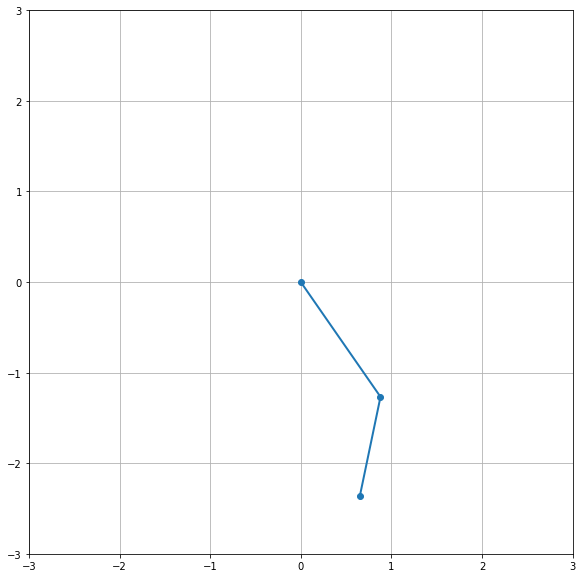

In [67]:
%matplotlib inline
from matplotlib import animation, rc
from IPython.display import HTML

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, autoscale_on=False, xlim=(-3, 3), ylim=(-3, 3))
ax.set_aspect('equal')
ax.grid()

line, = ax.plot([], [], '-o', lw=2)
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)


def init():
    line.set_data([], [])
    time_text.set_text('')
    return line, time_text


def animate(i):
    thisx = [0, x1[i], x2[i]]
    thisy = [0, y1[i], y2[i]]

    line.set_data(thisx, thisy)
    
    return (line,)


anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=1000, interval=20, 
                               blit=True)

HTML(anim.to_jshtml())

In [71]:
z.T.shape

(1000, 8)